## ECSE 415 - Intro to Computer Vision
### Assignment 2  
#### Saima Haneef - 260744058 

###### Note: Sections of the code (like Pyramid Blending and Linear Blending) are taken from Tutorial 4 and 5. To run the code, all images need to be placed in the same directory. 

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
import math
import random

In [2]:
def warpPerspectivePadded(
        imgl, H, imgr_shape):
    """Performs an affine or Euclidean/rigid warp with padding.
    Parameters
    ----------
    imgl : image to be warped i.e. left image
    imgr : shape of static image i.e. shape of central image
    M : `3x3` Homography matrix.
    Returns
    -------
    src_warped : padded and warped source image
    """
    
    src = imgl
    dst_shape = imgr_shape
    M = H
    
    # it is enough to find where the corners of the image go to find
    # the padding bounds; points in clockwise order from origin
    _, src_w = src.shape[:2]
    lin_pts = np.array([
        [0, src_w],
        [0, 0],
        [1, 1]])
    # transform points
    transf_lin_pts = M.dot(lin_pts) #M[:, :2].dot(lin_pts) + M[:, 2].reshape(3, 1)
    transf_lin_pts /= transf_lin_pts[-1:,:]
    
    # find min and max points
    min_x = np.floor(np.min(transf_lin_pts)).astype(int)
    max_x = np.ceil(np.max(transf_lin_pts)).astype(int)

    # add translation to the transformation matrix to shift to positive values
    anchor_x = 0
    transl_transf = np.eye(3,3)
    if min_x < 0:
        anchor_x = -min_x
        transl_transf[0,2] = anchor_x
        
    shifted_transf = transl_transf.dot(M)
    shifted_transf /= shifted_transf[2,2]

    # create padded destination image
    dst_h, dst_w,_ = dst_shape
    dst_pad_w = anchor_x + max(max_x, dst_w)
    src_warped = cv2.warpPerspective(src, shifted_transf, (dst_pad_w, dst_h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)
    return src_warped

## 1. Image Stitching

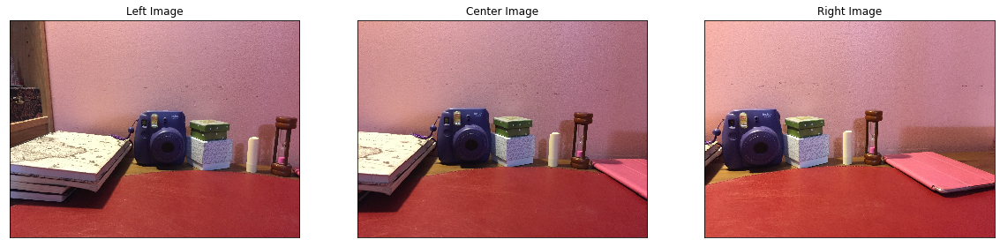

In [3]:
# load all the images
img = cv2.imread('./IMG_6265.jpg')
img2 = cv2.imread('./IMG_6266.jpg')
img3 = cv2.imread('./IMG_6267.jpg')

left = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
center = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
right = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# lower the dimensions of the original image (original image is too large)
newX,newY = left.shape[1]*0.2, left.shape[0]*0.2
left = cv2.resize(left,(int(newX),int(newY)))
newX,newY = center.shape[1]*0.2, center.shape[0]*0.2
center = cv2.resize(center,(int(newX),int(newY)))
newX,newY = right.shape[1]*0.2, right.shape[0]*0.2
right = cv2.resize(right,(int(newX),int(newY)))

# plot the left center and right image
plt.figure(figsize = (20,100))
plt.subplot(131)
plt.imshow(left)
plt.title("Left Image"), plt.xticks([]), plt.yticks([])

plt.subplot(132)
plt.imshow(center)
plt.title("Center Image"), plt.xticks([]), plt.yticks([])

plt.subplot(133)
plt.imshow(right)
plt.title("Right Image"), plt.xticks([]), plt.yticks([])
plt.show()

#### 1.1 Compute SIFT keypoints and corresponding descriptors for left and central images

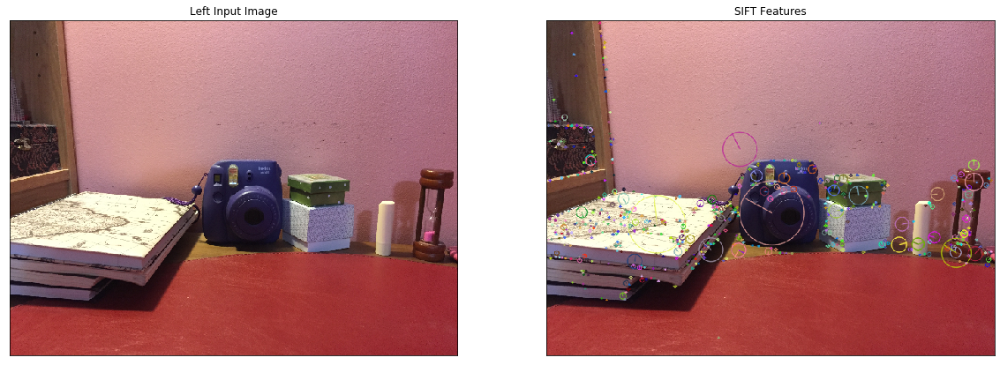

Number of keypoints: 576
Descriptors size: (576, 128)


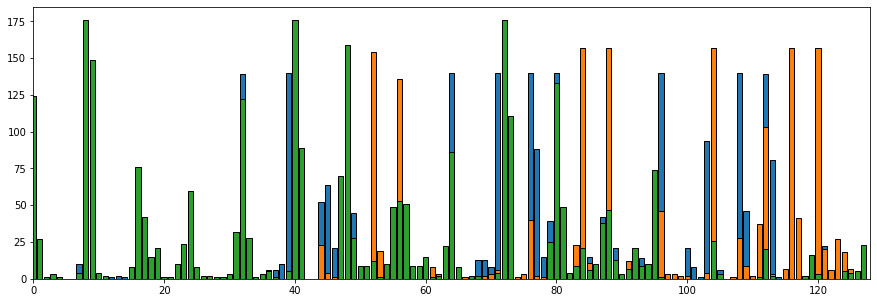

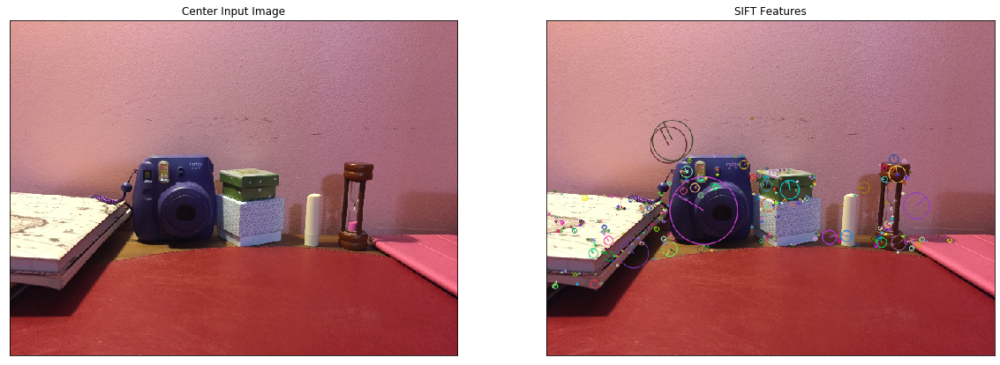

Num keypoints: 324
descriptors size: (324, 128)


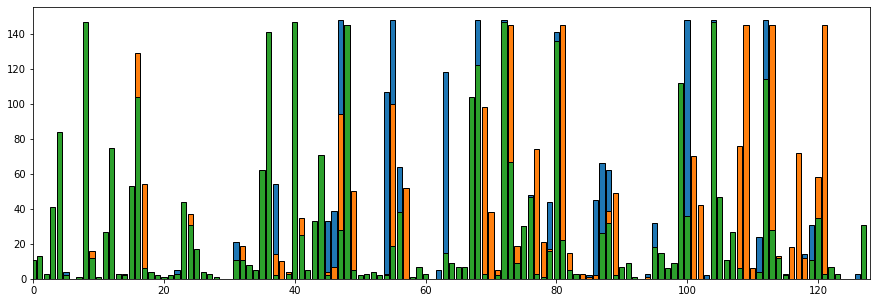

In [4]:
# Compute SIFT keypoints and descriptors for left image
img_disp = left.copy()

# make a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# find the SIFT features
keypoints = sift.detect(left, None)

# demonstrate the keypoints
cv2.drawKeypoints(left, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display the figures
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(left)
plt.title("Left Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_disp)
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

# Print out number of keypoints
print('Number of keypoints: '+ str(len(keypoints)))

# SIFT descriptor
kp1, des1 = sift.compute(left, keypoints)

# num of SIFT keypoints/descriptors
print('Descriptors size: '+ str(des1.shape))

# Plot histogram demonstrating the descriptors (shown in Tutorial 4)
num = 3
plt.figure(figsize=(15,5))
for i in range(num):
    plt.bar(np.arange(0,128),des1[i], edgecolor='k' )
    plt.xlim([0,128])
plt.show()


# Compute SIFT keypoints and descriptors for center image
centercopy = center.copy()

# make a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# find the SIFT features
keypoints = sift.detect(center, None)

# demonstrate the keypoints
cv2.drawKeypoints(center, keypoints, centercopy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display the figures
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(center)
plt.title("Center Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(centercopy)
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

# display number of SIFT keypoints
print('Num keypoints: '+ str(len(keypoints)))

# SIFT descriptors
kp2, des2 = sift.compute(center, keypoints)


# print number of SIFT descriptors
print('descriptors size: '+ str(des2.shape))

# Plot histogram demonstrating the descriptors (shown in Tutorial 4)
num = 3
plt.figure(figsize=(15,5))
for i in range(num):
    plt.bar(np.arange(0,128),des2[i], edgecolor='k' )
    plt.xlim([0,128]) 
plt.show()

#### 1.2 Find matching keypoints in two images and display the 20 best pairs

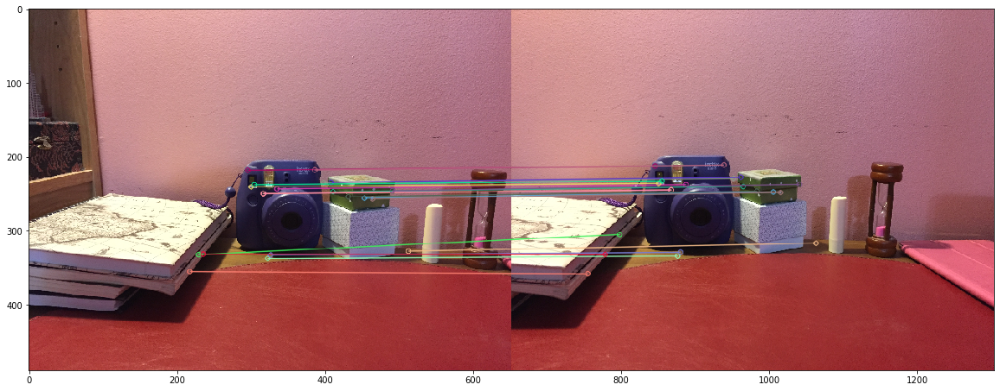

In [5]:
# find matching keypoints
matches = cv2.BFMatcher().match(des1,des2)
# Sort the matches
matches = sorted(matches, key = lambda x:x.distance)
# Display 20 matching keypoints
img3 = cv2.drawMatches(left,kp1,center,kp2,matches[:20],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(20,20))
plt.imshow(img3)
plt.show()

#### 1.3 & 1.4 Find homography using RANSAC method and apply transformation to left image. Central image should not be transformed. 

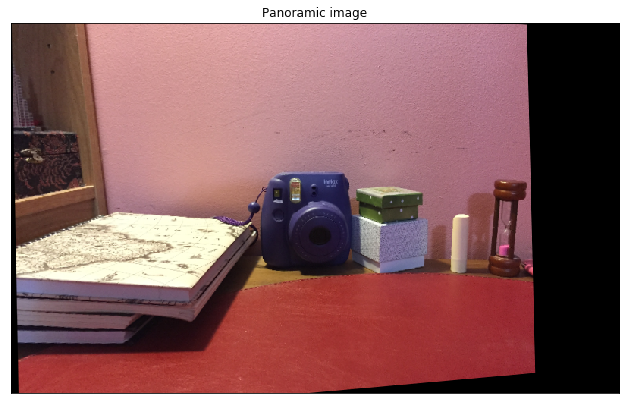

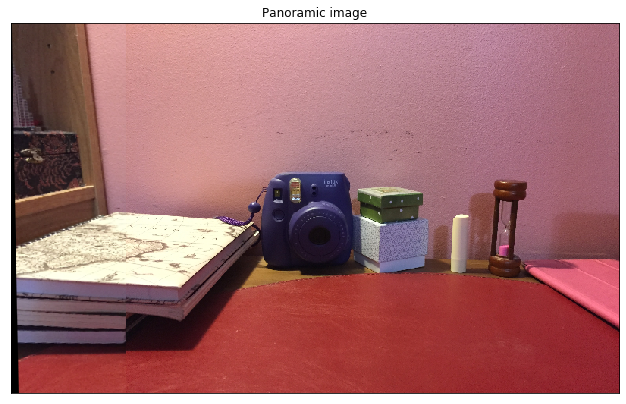

In [6]:
# RANSAC
# Load images to be stitched
imgl = cv2.imread('./IMG_6265.jpg')
imgr = cv2.imread('./IMG_6266.jpg')

imgl = cv2.cvtColor(imgl, cv2.COLOR_BGR2RGB)
imgr = cv2.cvtColor(imgr, cv2.COLOR_BGR2RGB)
# Lower dimensions of original image
newX,newY = imgl.shape[1]*0.2, imgl.shape[0]*0.2
imgl = cv2.resize(imgl,(int(newX),int(newY)))
newX,newY = imgr.shape[1]*0.2, imgr.shape[0]*0.2
imgr = cv2.resize(imgr,(int(newX),int(newY)))

# Compute keypoints and descriptors
sift_obj = cv2.xfeatures2d.SIFT_create()
keypoints_l, descriptors_l = sift_obj.detectAndCompute(imgl, None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(imgr, None)

# make BFMatcher object
bf = cv2.BFMatcher()

# Find matches
matches = bf.match(descriptors_r,descriptors_l)

# Sort the matches
matches = sorted(matches, key = lambda x:x.distance)

# Find good matches depending on distance
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 100:
        GoodMatches.append((m.trainIdx, m.queryIdx))

# Implementation of RANSAC

# initialize variables
maxinlier = 0
inlier = 0
rand = random.sample(GoodMatches, 50)
mpr = np.float32([keypoints_r[j].pt for (__, j) in GoodMatches])
mpl = np.float32([keypoints_l[j].pt for (j, __) in GoodMatches])
    
# iterate through a set number of times: in this case 1000
for i in range(0,1000):
    # pick random number of samples
    sample = random.sample(GoodMatches, 4)
    # find keypoints from samples 
    mpr_ = np.float32([keypoints_r[j].pt for (__, j) in sample])
    mpl_ = np.float32([keypoints_l[j].pt for (j, __) in sample])
    
    # find H matrix 
    H, __ = cv2.findHomography(mpl_, mpr_, 0, 4)
    
    # convert to homogenous (such that it becomes a 1x3 matrix; able to be multiplied by the H matrix)
    mplnew = cv2.convertPointsToHomogeneous(mpl)
    
    arr=[]
    # Find the new points by multiplying H by mpl to get the new mpr points
    for x in mplnew:
        val=(np.dot(H,np.transpose(x)))
        arr.append(val) 

    # convert the points back to a 1 x 2 matrix 
    mprnew = cv2.convertPointsFromHomogeneous(np.array(arr))

    # Go through the points in each list of old and new mpr points to find the euclidean distance
    # if the distance is less than a certain amount, it is an inlier
    y = zip(mprnew,mpr)
    for f,p in y:
        dist = np.linalg.norm(f-p)
        if dist<3:
            inlier = inlier+1
    # if the maxinlier count is exceeded, you found a better H matrix
    if inlier>=maxinlier:
        maxinlier = inlier
        Hnew = H
    inlier = 0

wimg = warpPerspectivePadded(imgl, Hnew, imgr.shape)
plt.figure(figsize=(15,15))
plt.subplot(212)
plt.imshow(wimg)
plt.title("Panoramic image"), plt.xticks([]), plt.yticks([])
plt.show()
wimg1 = wimg.copy()
wimg1[:,-imgr.shape[1]:,:] = imgr
plt.figure(figsize=(15,15))
plt.subplot(212)
plt.imshow(wimg1)
plt.title("Panoramic image"), plt.xticks([]), plt.yticks([])
plt.show()

#### 1.5 & 1.6 Stitch transformed left image and original central image together using pyramid image blending and display stitched image

In [7]:
# Gotten from Tutorial 5
def pyramidBlend(A,B):

    levels = 2

    # generate Gaussian pyramid for A
    G = A.copy()
    gpA = [G]
    for i in range(levels):
        G = cv2.pyrDown(G)
        gpA.append(G)
    # generate Gaussian pyramid for B
    G = B.copy()
    gpB = [G]
    for i in range(levels):
        G = cv2.pyrDown(G)
        gpB.append(G)
    # generate Laplacian Pyramid for A
    lpA = [gpA[levels-1]]
    for i in range(levels-1,0,-1):
        GE = cv2.pyrUp(gpA[i], dstsize=(gpA[i-1].shape[1], gpA[i-1].shape[0]))
        L = cv2.subtract(gpA[i-1],GE)
        lpA.append(L)
    # generate Laplacian Pyramid for B
    lpB = [gpB[levels-1]]
    for i in range(levels-1,0,-1):
        GE = cv2.pyrUp(gpB[i], dstsize=(gpB[i-1].shape[1], gpB[i-1].shape[0]))
        L = cv2.subtract(gpB[i-1], GE)
        lpB.append(L)
    # Now add left and right halves of images in each level
    LS = []
    for la,lb in zip(lpA,lpB):
        rows,cols,dpt = la.shape
        ls = np.hstack((la[:,0:round(cols/2)], lb[:,round(cols/2):]))
        LS.append(ls)
    # now reconstruct
    ls_ = LS[0]
    for i in range(1,levels):
        ls_ = cv2.pyrUp(ls_, dstsize=(LS[i].shape[1], LS[i].shape[0]))
        ls_ = cv2.add(ls_, LS[i])
    # image with direct connecting each half
    real = np.hstack((A[:,:A.shape[1]],B[:,A.shape[1]:]))

    return real, ls_

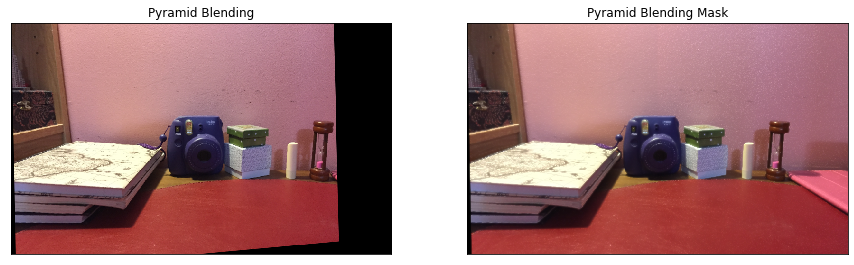

In [8]:
zero = np.zeros((imgr.shape[0],(wimg.shape[1]-imgr.shape[1]),3), dtype = imgr.dtype)
imgr = np.concatenate((zero,imgr), axis=1)
real, ls_ = pyramidBlend(wimg,imgr)

# display results
plt.figure(figsize=(15,15))
plt.subplot(121), plt.imshow((real))
plt.title('Pyramid Blending'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow((ls_))
plt.title('Pyramid Blending Mask'), plt.xticks([]), plt.yticks([])
plt.show()
# 

#### 1.7 Compute SURF keypoints and corresponding descriptors for above stitched image and right image

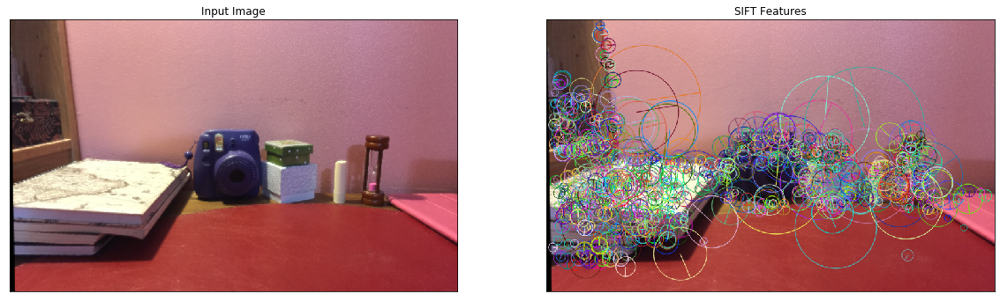

Num keypoints: 991
descriptors size: (991, 64)


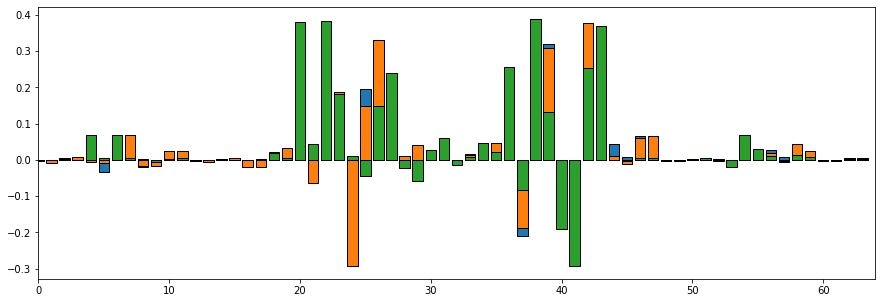

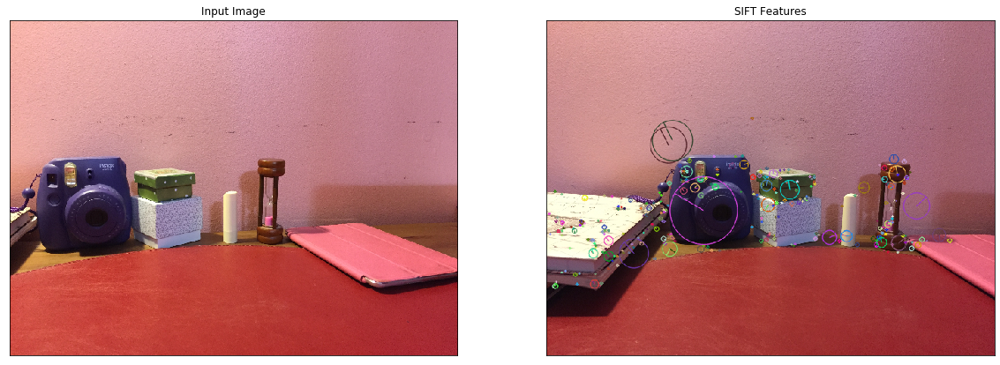

Num keypoints: 724
descriptors size: (724, 64)


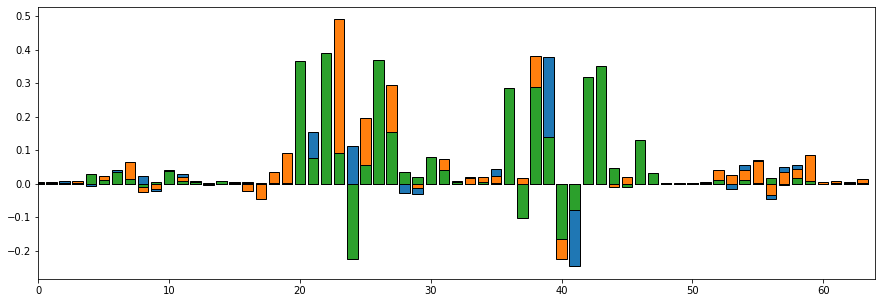

In [9]:
# Compute SURF keypoints for the above stitched image

img_disp = ls_.copy()

# make a SURF object
surf = cv2.xfeatures2d.SURF_create()

# find SURF keypoints
keypoints = surf.detect(ls_, None)
cv2.drawKeypoints(ls_, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display the figures
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(ls_)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_disp)
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

# print number of keypoints
print('Num keypoints: '+ str(len(keypoints)))

# Find SURF descriptors
kp1, des1 = surf.compute(ls_, keypoints)

# Print number of descriptors
print('descriptors size: '+ str(des1.shape))

# display the histogram of the descriptors (from Tutorial 4)
num = 3
plt.figure(figsize=(15,5))
for i in range(num):
    plt.bar(np.arange(0,64),des1[i], edgecolor='k' )
    plt.xlim([0,64]) 
plt.show()

# Compute SURF keypoints for the right image
rightcopy = right.copy()

# make a SURF object
surf = cv2.xfeatures2d.SURF_create()

# find SURF keypoints
keypoints = surf.detect(right, None)

# find keypoints
cv2.drawKeypoints(right, keypoints, rightcopy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(right)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(centercopy)
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

# print number of SURF keypoints
print('Num keypoints: '+ str(len(keypoints)))

# compute SURF descriptors
kp2, des2 = surf.compute(right, keypoints)

# print number of SURF descriptors
print('descriptors size: '+ str(des2.shape))

# display the histogram of the descriptors (from Tutorial 4)
num = 3
plt.figure(figsize=(15,5))
for i in range(num):
    plt.bar(np.arange(0,64),des2[i], edgecolor='k' )
    plt.xlim([0,64])
plt.show()

#### 1.8 Find matching keypoints in two images and display the 20 best pairs. 

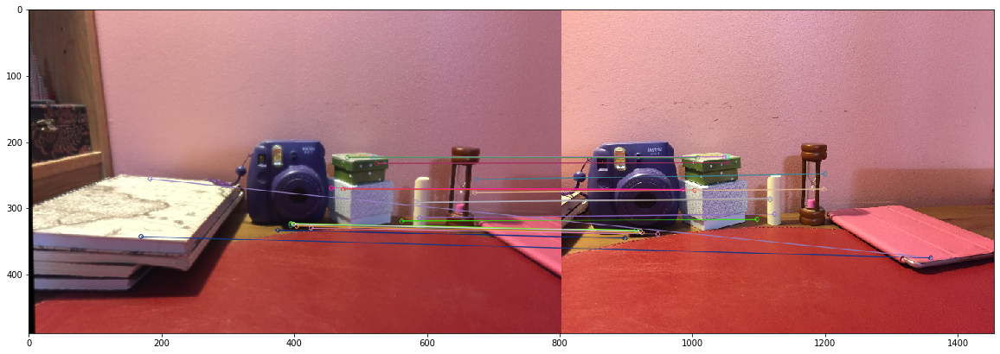

In [10]:
# Find matches
matches = cv2.BFMatcher().match(des1,des2)
# Sort matches
matches = sorted(matches, key = lambda x:x.distance)
# Find 20 matching points
img3 = cv2.drawMatches(ls_,kp1,right,kp2,matches[:20],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(20,20))
plt.imshow(img3)
plt.show()

#### 1.9 & 1.10 Find homography using RANSAC method. • Apply transformation to right image. The stitched image should not be transformed.

(724, 2)


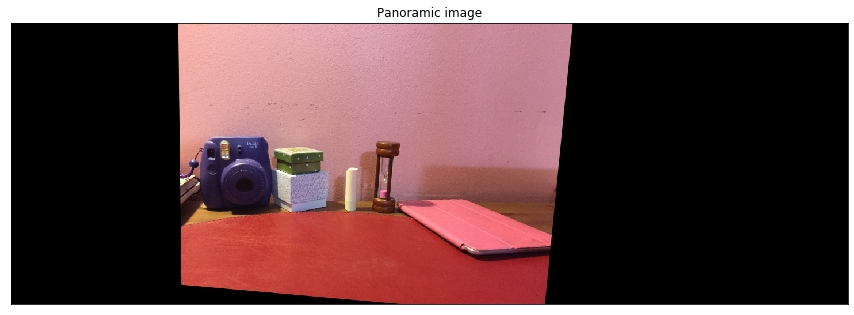

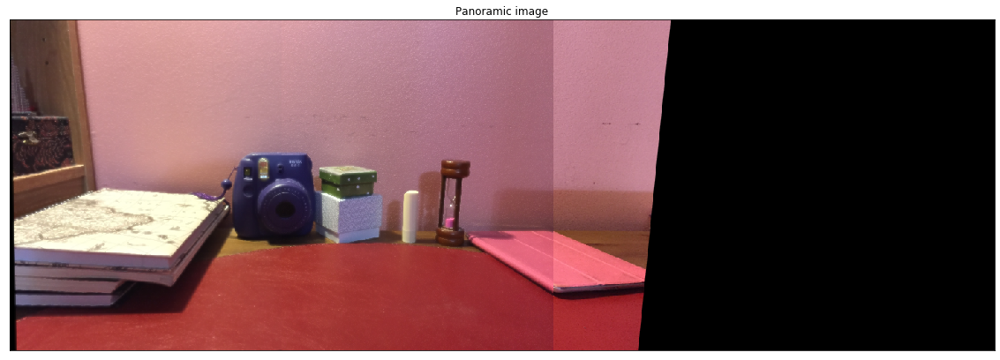

In [11]:
# Initialize variables
imgl = ls_
imgr = right

# Compute keypoints and descriptors
surf_obj = cv2.xfeatures2d.SURF_create()
keypoints_l, descriptors_l = surf_obj.detectAndCompute(imgl, None)
keypoints_r, descriptors_r = surf_obj.detectAndCompute(imgr, None)

# make a BFMatcher object
bf = cv2.BFMatcher()

# Find matches
matches = bf.match(descriptors_r,descriptors_l)

# Sort the matches
matches = sorted(matches, key = lambda x:x.distance)

# Find good matches based on evaluation of distance
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 100:
        GoodMatches.append((m.trainIdx, m.queryIdx))
        
# initialize variables
maxinlier = 0
inlier = 0
rand = random.sample(GoodMatches, 50)
Hnew = np.zeros((3,3))

mpr = np.float32([keypoints_r[j].pt for (__, j) in GoodMatches])
mpl = np.float32([keypoints_l[j].pt for (j, __) in GoodMatches])
print(mpr.shape)
# iterate through a set number of times: in this case 1000
for i in range(0,1000):
#     # pick random number of samples
    sample = random.sample(GoodMatches, 4)

#     # find keypoints from samples 
    mpr_ = np.float32([keypoints_r[j].pt for (__, j) in sample])
    mpl_ = np.float32([keypoints_l[j].pt for (j, __) in sample])

    # find H matrix 
    H, __ = cv2.findHomography(mpr_, mpl_, 0)
    
    # convert to homogenous (such that it becomes a 1x3 matrix; able to be multiplied by the H matrix)
    mprnew = cv2.convertPointsToHomogeneous(mpr)

    arr=[]
    # Find the new points by multiplying H by mpl to get the new mpr points
    for x in mprnew:
        val=(np.dot(H,np.transpose(x)))
        arr.append(val) 
    
    # convert the points back to a 1 x 2 matrix 
    mplnew = cv2.convertPointsFromHomogeneous(np.array(arr))
    

    # Go through the points in each list of old and new mpr points to find the euclidean distance
    # if the distance is less than a certain amount, it is an inlier
    y = zip(mplnew,mpl)
    for f,p in y:
        dist = np.linalg.norm(f-p)
        if dist<10:
            inlier = inlier+1

    # if the maxinlier count is exceeded, you found a better H matrix
    if inlier > maxinlier:
        maxinlier = inlier
        Hnew = H
    inlier = 0
    
wimg = cv2.warpPerspective(imgr, Hnew, (imgr.shape[1]+imgl.shape[1],imgl.shape[0]))
plt.figure(figsize=(15,15))
plt.subplot(212)
plt.imshow(wimg)
plt.title("Panoramic image"), plt.xticks([]), plt.yticks([])
plt.show()
wimg1 = wimg.copy()

wimg1[:,:imgl.shape[1],:] = imgl

plt.figure(figsize=(20,20))
plt.subplot(212)
plt.imshow(wimg1)
plt.title("Panoramic image"), plt.xticks([]), plt.yticks([])
plt.show()

#### 1.11 & 1.12 Stitch transformed right image and already stitched left and central images together using linear image blending. Display final panoramic image. You can crop panoramic image to remove excess zero-padding; however it is not compulsory

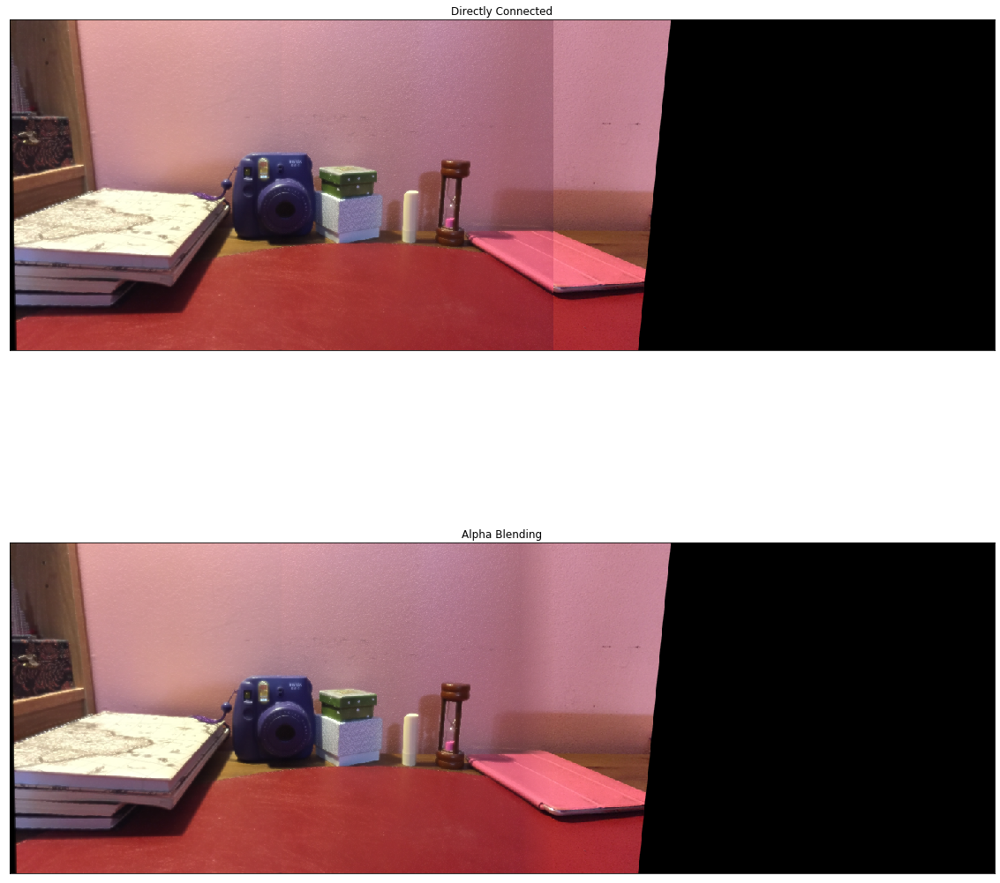

In [12]:
# Gotten from Tutorial 5
""" ALPHA BLENDING """
def Ramp(i_width, r_width, r_index, start, end):
    """
    Create alpha blending function
    :param i_width: img width
    :param r_width: ramp width
    :param r_index: center ramp index
    :param start: starting ramp value
    :param end: ending ramp value
    :return:
    """
    a = np.zeros((i_width))
    step = (end - start) / (r_width-1)
    idx = round(r_index - (r_width / 2))  # left side starting index of alpha ramp
    for i in range(r_width):
        a[idx] = start + step*i
        idx += 1
    a[idx:] = 1
    return a


def linearblend(A,B,C):
    # width and height of image
    
    col, row = A.shape[0:2]
    # image with direct connecting each half
    real = np.hstack((A[:, :A.shape[1]], B[:, A.shape[1]:]))
    
    # alpha blending ramp
    ramp_size = 50  # alpha blending ramp size
    alpha = Ramp(C.shape[1], ramp_size, A.shape[1]-(ramp_size)/2, 0, 1)

    # Now blend
    I_blend = (1-alpha.reshape(1,-1,1))*C + alpha.reshape(1,-1,1)*B
    I_blend = np.uint8(I_blend)  # convert back to uint8

    # display images
    plt.figure(figsize=(20,20))
    plt.subplot(211), plt.imshow(real)
    plt.title("Directly Connected"), plt.xticks([]), plt.yticks([])
    plt.subplot(212), plt.imshow(I_blend)
    plt.title("Alpha Blending"), plt.xticks([]), plt.yticks([])
    plt.show()

zero = np.zeros((ls_.shape[0],(wimg.shape[1]-ls_.shape[1]),3), dtype = ls_.dtype)
ls_copy = np.concatenate((ls_,zero), axis=1)
linearblend(ls_ ,wimg, ls_copy)

#### 1.13 Compare and comment on effectiveness of pyramid and linear blending. Discuss the pros and cons of both methods

>Based on the results gotten above, it can be seen that pyramid blending affects the entire image it received while linear blending only affects the particular region in which the both of the images being blended are joined together. As can be seen above, for linear blending, the hard defined line in the diagram labelled "Directly Connected", is blended appropriately without affecting the rest of the regions in the overall image. On the other hand, pyramid blending results in a glowing effect in the overall image, seemingly having the same affect all over the image. Depending on what is desirable, this could serve as a pro or a con. Pyramid blending is also more computationally expensive in comparison to linear blending. Pyramid blending utilizes gaussian filtering, which aids in reducing overall noise and smoothing the image. 

## 2. Object Detection

### 2.1 Training

#### 2.1.1 & 2.1.2 & 2.1.3 & 2.1.4. Resize the training images to 128 × 128. Compute HoG features using cell size of 4 × 4 pixels, block size of 2 × 2 cells and 9 orientation bins. Calculate and store the mean feature map across training images. Display 9 orientation channels of the mean feature maps for the first block

In [13]:
def HoGfeatures(img, cell_size, block_size, nbins):
    # Compute HoG features

    hog = cv2.HOGDescriptor(_winSize=(img.shape[1] // cell_size[1] * cell_size[1],
                                          img.shape[0] // cell_size[0] * cell_size[0]),
                                _blockSize=(block_size[1] * cell_size[1],
                                            block_size[0] * cell_size[0]),
                                _blockStride=(cell_size[1], cell_size[0]),
                                _cellSize=(cell_size[1], cell_size[0]),
                                _nbins=nbins)


    feats = hog.compute(img)
    return feats

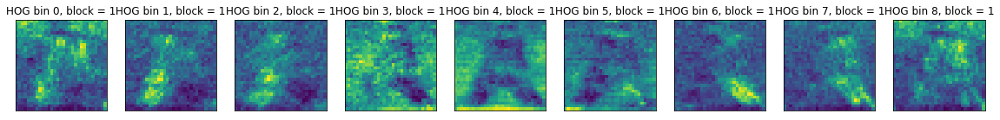

In [14]:
# Path set for training set
path1='./train_set/'
feats=[]

x = './train_set/p1.png'
x = cv2.cvtColor(cv2.imread(x),cv2.COLOR_BGR2GRAY)
# Resize images
x = cv2.resize(x,(128,128))

cell_size = (4, 4)  # h x w in pixels
block_size = (2, 2)  # h x w in cells
nbins = 9  # number of orientation bins
# Find feature map of first image and append it to the array
feats = HoGfeatures(x, cell_size, block_size, nbins)

# add all feature maps to the array and then find the average to get the mean feature map
for i in range(2,len(os.listdir(path1))+1):
    x = cv2.cvtColor(cv2.imread(path1+'p'+str(i)+'.png'),cv2.COLOR_BGR2GRAY)
    x = cv2.resize(x,(128,128))

    # Find HoG features
    hog_feats = HoGfeatures(x, cell_size, block_size, nbins)
    feats = np.append(feats,hog_feats,axis = 1)

avfeats = np.average(feats,axis=1).reshape(feats.shape[0], 1)

# total number of rows and columns in the image
n_cells = (x.shape[0] // cell_size[0], x.shape[1] // cell_size[1])

# Find HoG features
feats_reshaped = avfeats \
               .reshape(n_cells[1] - block_size[1] + 1,
                        n_cells[0] - block_size[0] + 1,
                        block_size[1], block_size[0], nbins) \
               .transpose((1, 0, 3, 2, 4))  # index blocks by rows first


# Preview the mean feature map
plt.figure(figsize = (20,100))
for n in range(9):
    plt.subplot(191+n)
    plt.pcolor(feats_reshaped[:, :, 0,0,n])
    plt.gca().invert_yaxis()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.title("HOG bin " + str(n)+ ", block = 1"), plt.xticks([]), plt.yticks([])
plt.show()


### 2.2 Testing

#### 2.2.1. Extract overlapping windows from the test image. Experiment with stride and size of the window to achieve good performance. 

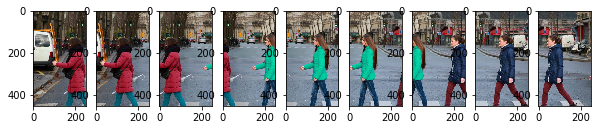

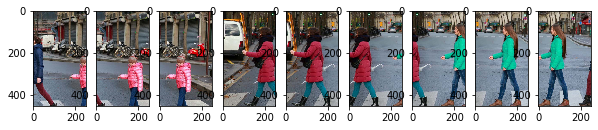

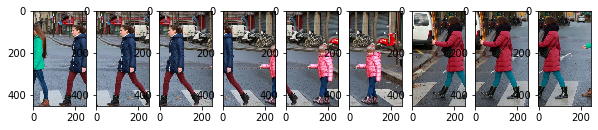

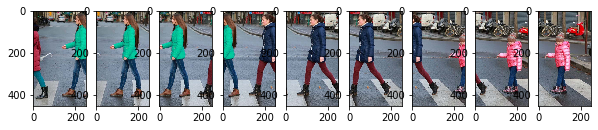

<Figure size 720x720 with 0 Axes>

In [15]:
# load the image
# the values below can be tuned and experimented to output the windows as shown below.
img = cv2.imread("test_image.png")
cell_size = (4, 4)  # h x w in pixels
block_size = (2, 2)  # h x w in cells
nbins = 9  # number of orientation bins
count = 0

image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
image2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

tmp = image2.copy()
stridex = 50
stridey = 70
(width, height) = (250,450) # window size

n = 0
plt.figure(figsize=(10,10))
for y in range(0, image.shape[0]-stridey, stridex):
    for x in range(0, image.shape[1]-stridex, stridey):
        window = image2[y:y + height, x:x+width]
        # disregard windows that are not the appropriate size
        if window.shape[0]!= 450 or window.shape[1]!=250:
            continue
        plt.subplot(191+n%9)
        plt.imshow(window)
        n = n+1
        if (n%9 ==0 and n!=0):
            plt.show()
            plt.figure(figsize=(10,10))

#### 2.2.2 & 2.2.3 & 2.2.4. Extract overlapping windows from the test image. Experiment with stride and size of the window to achieve good performance. Resize windows to 128 × 128 and Compute HoG features similar to what was done during training. Compute the Euclidean distance between the feature map of each window and the mean feature map of training images. . Threshold the Euclidean distances to detect pedestrians in the test image. Display the detected window. 

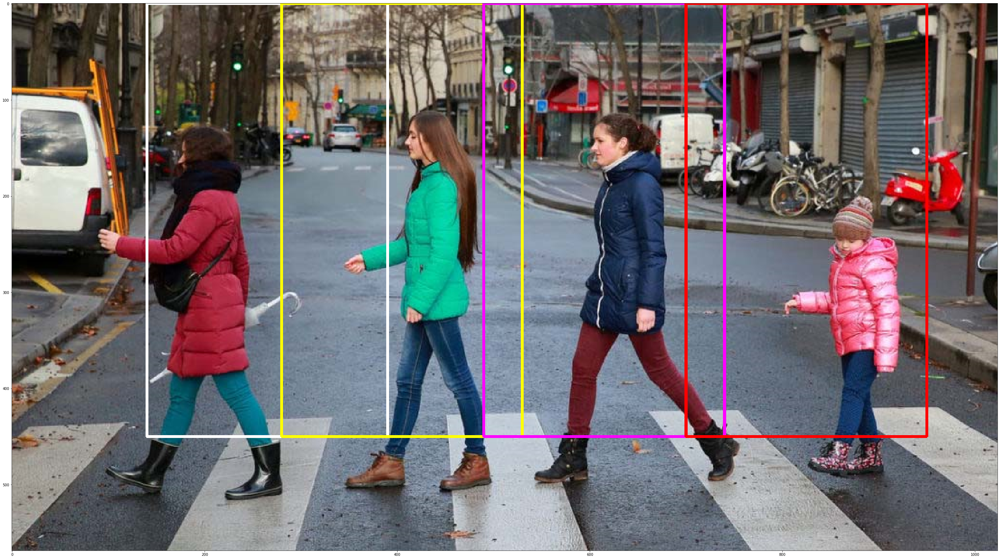

In [16]:
stridex = 50
stridey = 70
(width, height) = (250,450) # window size
count=0
for y in range(0, image.shape[0]-stridey, stridex):
    for x in range(0, image.shape[1]-stridex, stridey):
        window = image[y:y+height, x:x+width]
        # disregard windows that are not the appropriate size
        if window.shape[0]!= 450 or window.shape[1]!=250:
            continue
        window = cv2.resize(window,(128,128))
        # find HOG features
        featmap = HoGfeatures(window, cell_size, block_size, nbins)
        # Compute euclidean distance
        distance = np.linalg.norm(avfeats-featmap)
        
        # different RGB values to present different colored boxes
        rgb = [(255,255,255),(255,255,0),(255, 0, 255),(255, 0, 0)]
        # if distance is less than a certain amount then, create a box around the detected image
        if distance<=19:
            if count==4:
                break
            tmp = cv2.rectangle(tmp, (x, y), (x + width, y + height), (rgb[count]), 2) # draw rectangle on image
            count = count + 1

plt.figure(figsize=(50,50))
plt.imshow(tmp)
plt.show()

#### 2.2.5 Discuss the performance of above method. Did you detect all four pedestrians in the test image?  Suggest methods to improve results.

>Using this method, all four pedestrians were able to be detected in the test image. Due to the fact that only 30 training images were given, the detection could be improved such that the pedestrian being detected could be completely centered. To improve the results, more tuning could be performed. The window shape and stride could be tuned more, such that the pedestrians were detected more accurately. Having more training images could also allow the overall performance of the detection to be better and having a more diverse set of training images could result in a better output. A more accurate threshold could also have been found for the distance threshold (between the found HoG features and mean feature map).